In [1]:
import copy
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import io
from flask import send_file

import backwardcompatibilityml.loss as bcloss
import backwardcompatibilityml.scores as scores
from backwardcompatibilityml.helpers import training
from backwardcompatibilityml.widget.compatibility_analysis import CompatibilityAnalysis

# Turn off warnings so that the widget screen
# real estate does not decrease.
import warnings
warnings.filterwarnings("ignore")

# Initialize random seed
random.seed(123)
torch.manual_seed(456)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

%matplotlib inline

In [2]:
# You may need to adjust some of these parameters to increase the speed of training
# or to adjust memory usage.
n_epochs = 10
batch_size_train = 25
batch_size_test = 10
learning_rate = 0.001
momentum = 0.9
log_interval = 10


transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [3]:
# training_set = torchvision.datasets.CIFAR10('datasets/', train=True, download=True,
#                              transform=transform)
# testing_set = torchvision.datasets.CIFAR10('datasets/', train=False, download=True,
#                              transform=transform)

In [4]:
data_set = torchvision.datasets.CIFAR10('datasets/', download=True, transform=transform)

Files already downloaded and verified


In [5]:
data_loader = torch.utils.data.DataLoader(data_set)

In [6]:
data_loader = list(data_loader)

In [7]:
instance_ids = list(range(len(data_loader)))

In [8]:
dataset = []
for (instance_id, (data_instance, data_label)) in zip(instance_ids, data_loader):
    dataset.append([instance_id, data_instance.view(3, 32, 32), data_label.view(1)])

In [9]:
random.shuffle(dataset)

In [10]:
training_set = dataset[:int(0.8 * len(dataset))]
testing_set = dataset[int(0.8 * len(dataset)):]

In [11]:
len(training_set), len(testing_set)

(40000, 10000)

In [12]:
train_loader = []
prev = 0
for i in range((batch_size_train - 1), len(training_set), batch_size_train):
    batch_ids = list(map(lambda r: r[0], training_set[prev:i]))
    training_data = list(map(lambda r: r[1], training_set[prev:i]))
    training_labels = list(map(lambda r: r[2], training_set[prev:i]))
    prev = i
    train_loader.append([batch_ids, torch.stack(training_data, dim=0), torch.stack(training_labels, dim=0).view(len(training_labels))])

test_loader = []
prev = 0
for i in range((batch_size_test - 1), len(testing_set), batch_size_test):
    batch_ids = list(map(lambda r: r[0], testing_set[prev:i]))
    testing_data = list(map(lambda r: r[1], testing_set[prev:i]))
    testing_labels = list(map(lambda r: r[2], testing_set[prev:i]))
    prev = i
    test_loader.append([batch_ids, torch.stack(testing_data, dim=0), torch.stack(testing_labels, dim=0).view(len(testing_labels))])

In [13]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [14]:
def unnormalize(img):
    img = img / 2 + 0.5
    return img

def convert_to_image(raw_data):
    return unnormalize(np.transpose(raw_data, (1, 2, 0))).numpy()

In [15]:
def get_instance_image(instance_id):
    img_bytes = io.BytesIO()
    data = data = np.uint8(np.transpose((unnormalize(dataset[instance_id][1])), (1, 2, 0)).numpy() * 255)
    img = Image.fromarray(data, 'RGB')
    img.save(img_bytes, format="PNG")
    img_bytes.seek(0)

    return send_file(img_bytes, mimetype='image/png')

In [16]:
# train_loader = torch.utils.data.DataLoader(
#   training_set,
#   batch_size=batch_size_train, shuffle=True, num_workers=2)

# test_loader = torch.utils.data.DataLoader(
#   testing_set,
#   batch_size=batch_size_test, shuffle=True, num_workers=2)

In [17]:
# train_loader = list(train_loader)

In [18]:
# test_loader = list(test_loader)

In [19]:
# train_loader_a = train_loader[:int(len(train_loader) * 3/4)]
# train_loader_b = train_loader[int(len(train_loader) * 3/4):]

In [20]:
train_loader[0][1].size()

torch.Size([24, 3, 32, 32])

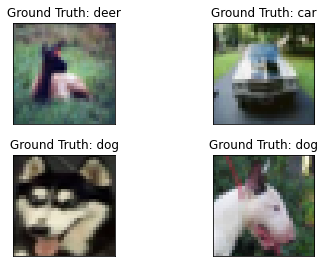

In [21]:
fig = plt.figure()
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.tight_layout()
    plt.imshow(convert_to_image(train_loader[0][1][i]), interpolation='none')
    plt.title("Ground Truth: {}".format(classes[train_loader[0][2][i]]))
    plt.xticks([])
    plt.yticks([])


In [22]:
class Net(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 18, kernel_size=3, stride=1, padding=1)
        self.fc2 = nn.Linear(18*32*32, 192)
        self.fc3 = nn.Linear(192, 192)
        self.fc4 = nn.Linear(192, 192)
        self.fc5 = nn.Linear(192, 192)
        self.fc6 = nn.Linear(192, 10)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = x.view(-1, 18*32*32)
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = F.relu(self.fc5(x))
        x = self.fc6(x)
        
        return x, F.softmax(x, dim=1), F.log_softmax(x, dim=1)


class DeeperNet(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Conv2d(3, 18, kernel_size=3, stride=1, padding=1)
        self.max_pool1 = nn.MaxPool2d(2, stride=2)
        self.conv2 = nn.Conv2d(18, 36, kernel_size=3, stride=1, padding=1)
        self.max_pool2 = nn.MaxPool2d(2, stride=2)
        self.conv3 = nn.Conv2d(36, 72, kernel_size=3, stride=1, padding=1)
        self.max_pool3 = nn.MaxPool2d(2, stride=2)
        self.dense = nn.Linear(72*4*4, 4096)
        self.dense_output = nn.Linear(4096, 10)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool2(x)
        x = F.relu(self.conv3(x))
        x = self.max_pool3(x)
        x = x.view(-1, 72*4*4)
        x = F.relu(self.dense(x))
        x = self.dense_output(x)
        
        return x, F.softmax(x, dim=1), F.log_softmax(x, dim=1)


from torchvision.models import ResNet
from torchvision import models

class ResNetPretrainedWrapperModel(nn.Module):
    
    def __init__(self, *args, **kwargs):
        super().__init__()
        resnet_modules = list(models.resnet18(pretrained=True).children())
        self.resnet_upper_layers = nn.Sequential(*resnet_modules[:-1])
        self.final_layer = nn.Linear(512, 10)
    
    def forward(self, x):
        x = self.resnet_upper_layers(x)
        x = torch.flatten(x, 1)
        output_logit = self.final_layer(x)
        
        return output_logit, F.softmax(output_logit, dim=1), F.log_softmax(output_logit, dim=1)

In [23]:
h1 = ResNetPretrainedWrapperModel().cuda()
# h1 = models.resnet18(pretrained=True).cuda()
optimizer = optim.SGD(h1.parameters(), lr=learning_rate, momentum=momentum)

In [24]:
train_counter, test_counter, train_losses, test_losses = training.train(
    n_epochs, h1, optimizer, F.nll_loss, train_loader, test_loader,
    batch_size_train, batch_size_test, device="cuda")

Text(0, 0.5, 'negative log likelihood loss')

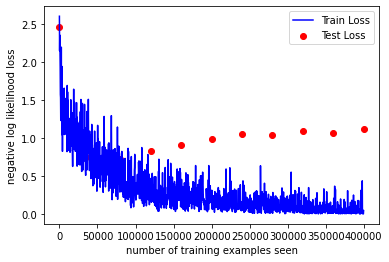

In [25]:
fig = plt.figure()
plt.scatter(test_counter, test_losses, color='red')
plt.plot(train_counter, train_losses, color='blue')
plt.legend(['Train Loss', 'Test Loss'], loc='upper right')
plt.xlabel('number of training examples seen')
plt.ylabel('negative log likelihood loss')

In [26]:
input_data = test_loader[0][1]
with torch.no_grad():
    _, _, output = h1(input_data.to("cuda"))

del input_data
torch.cuda.empty_cache()

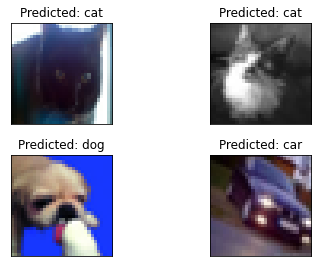

In [27]:
_, images, labels = test_loader[0]
_, predicted = torch.max(output, 1)

fig = plt.figure()
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.tight_layout()
    plt.imshow(convert_to_image(images[i]), interpolation='none')
    plt.title("Predicted: {}".format(classes[predicted[i]]))
    plt.xticks([])
    plt.yticks([])

In [28]:
# Here we are setting h2 to be a copy of h1 but in actuality,
# we could pass in any model as h2.
torch.cuda.empty_cache()
h2 = DeeperNet().cuda()

analysis = CompatibilityAnalysis("sweeps-cifar10", 5, h1, h2, train_loader, test_loader,
    batch_size_train, batch_size_test,
    OptimizerClass=optim.SGD,
    optimizer_kwargs={"lr": learning_rate, "momentum": momentum},
    NewErrorLossClass=bcloss.BCCrossEntropyLoss,
    StrictImitationLossClass=bcloss.StrictImitationCrossEntropyLoss,
    lambda_c_stepsize=0.25,
    get_instance_image_by_id=get_instance_image,
    device="cuda")